In [1]:
import sys
import os
Lpath = os.path.abspath('..')
print("found path with os.path.abspath('..'): ", Lpath)
sys.path.insert(0, Lpath)

print(sys.path)

import numpy as np
import tflearn
import tflearn.activations as activations
# Data loading and preprocessing
from tflearn.activations import relu
from tflearn.data_utils import shuffle, to_categorical
from tflearn.layers.conv import avg_pool_2d, conv_2d, max_pool_2d, global_avg_pool 
from tflearn.layers.core import dropout, flatten, fully_connected, input_data
from tflearn.layers.merge_ops import merge
from tflearn.layers.normalization import local_response_normalization
from tflearn.layers.normalization import batch_normalization



#chris library imports
from matplotlib import pyplot as plt
import cv2
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import normalize

from test_recursive_image_load_V2 import load_CKP_data
from test_recursive_image_load_V2 import load_formated_data
from test_recursive_image_load_V2 import split_dataset
from test_recursive_image_load_V2 import divide_subjects
from test_recursive_image_load_V2 import divide_data_to_subject
from test_recursive_image_load_V2 import load_npy_files

from showNumpyInfo import showInfo

# from Dexpression_network import create_Dexpression_old_network
# from Dexpression_network import create_Dexpression_network
# # from Dexpression_network import create_Dexpression_FX2_out_layer

from display_image import display


found path with os.path.abspath('..'):  G:\Documenten\personal\school\MaNaMA_AI\thesis\implementation\dexpression\github_1\github\Thesis_Christiaan_Jean\Custom_Dexpression
['G:\\Documenten\\personal\\school\\MaNaMA_AI\\thesis\\implementation\\dexpression\\github_1\\github\\Thesis_Christiaan_Jean\\Custom_Dexpression', '', 'a:\\users\\christiaan\\appdata\\local\\programs\\python\\python36\\python36.zip', 'a:\\users\\christiaan\\appdata\\local\\programs\\python\\python36\\DLLs', 'a:\\users\\christiaan\\appdata\\local\\programs\\python\\python36\\lib', 'a:\\users\\christiaan\\appdata\\local\\programs\\python\\python36', 'a:\\users\\christiaan\\appdata\\local\\programs\\python\\python36\\lib\\site-packages', 'a:\\users\\christiaan\\appdata\\local\\programs\\python\\python36\\lib\\site-packages\\IPython\\extensions', 'C:\\Users\\christiaan\\.ipython']
hdf5 is not supported on this machine (please install/reinstall h5py for optimal experience)
curses is not supported on this machine (please i

In [2]:
# global Paths to define for each specific computer
#tf_checkpoints = where the checkpoints of tensorflow training algorithms are stored to be recovered if necessary
tf_checkpoints = "G:/Documenten/personal/school/MaNaMA_AI/thesis/implementation/dexpression/github_1/github/Thesis_Christiaan_Jean/Custom_Dexpression/tf_checkpoints"

#load data
# try:
#     X_data = np.load('../data/CKP_X.npy')
#     Y_data = np.load('../data/CKP_Y.npy')
#     X_subID = (np.load('../data/CKP_subjectIds.npy')).astype('uint8')
# except:
#     X_data = np.load('G:/Documenten/personal/school/MaNaMA_AI/thesis/implementation/dexpression/github_1/github/Thesis_Christiaan_Jean/data/CKP_X.npy')
#     Y_data = np.load('G:/Documenten/personal/school/MaNaMA_AI/thesis/implementation/dexpression/github_1/github/Thesis_Christiaan_Jean/data/CKP_Y.npy')
#     X_subID = (np.load('G:/Documenten/personal/school/MaNaMA_AI/thesis/implementation/dexpression/github_1/github/Thesis_Christiaan_Jean/data/CKP_subjectIds.npy')).astype('uint8')
dire = 'CKP_all'

[X_data,Y_data,X_subID] = load_npy_files(5,dire)

#load the subject distribution over the different datasets
subID = (np.load('../data_division/'+dire+'/train_subject_ID.npy')).astype('uint8')
subID_val = (np.load('../data_division/'+dire+'/validation_subject_ID.npy')).astype('uint8')
subID_test = (np.load('../data_division/'+dire+'/test_subject_ID.npy')).astype('uint8')
subIDs = [subID, subID_val, subID_test]

# divided_data = divide_data_to_subject([X_data,Y_data,X_subID],subIDs)

# print(X.shape)
# print(X.dtype)

# def format_data(divided_data):
#     X = (divided_data[0].reshape(-1,224,224,1)).astype('uint8')
#     Y = (divided_data[1].reshape(-1,7)).astype('uint8')

#     # create the validation set X_val and Y-val (SubID_val is not given to the network)
#     X_val = divided_data[2].reshape(-1,224,224,1).astype('uint8')
#     Y_val = divided_data[3].reshape(-1,7).astype('uint8')

#     # create the test set X_test and Y_test (SubID_test is not given to the network)
#     X_test = divided_data[4].reshape(-1,224,224,1).astype('uint8')
#     Y_test = divided_data[5].reshape(-1,7).astype('uint8')  
    
#     return [X,Y,X_val,Y_val,X_test,Y_test]

# [X,Y,X_val,Y_val,X_test,Y_test] = format_data(divided_data)
# print(X.shape)
# print(X.dtype)


[WARNING] could not load from path: ./data/CKP_all 
 because of: [Errno 2] No such file or directory: './data/CKP_all/X.npy' error
[WARNING] could not load from path: ./../data/CKP_all 
 because of: [Errno 2] No such file or directory: './../data/CKP_all/X.npy' error
[SUCCEED]data found in path:  ./../../data/CKP_all
Name  X_data
type:  <class 'numpy.ndarray'>
Dtype:  float64
shape:  (1958, 224, 224, 1)
Name  Y_data
type:  <class 'numpy.ndarray'>
Dtype:  float64
shape:  (1958, 7)
Name  X_subID
type:  <class 'numpy.ndarray'>
Dtype:  uint8
shape:  (1958,)


In [3]:
tf.reset_default_graph()
tflearn.config.init_training_mode()

In [4]:
    # Give a dropout if required (change to True and define the dropout percentage).
    dropout = False
    dropout_keep_prob = 0.5
    
    # Define number of output classes.
    num_classes = 7

    # Define padding scheme.
    padding = 'VALID'

    # Model Architecture
    network = input_data(shape=[None, 224, 224, 1])
    conv_1 = relu(conv_2d(network, 64, 7, strides=2, bias=True, padding=padding, activation=None, name='Conv2d_1'))
    maxpool_1 = batch_normalization(max_pool_2d(conv_1, 3, strides=2, padding=padding, name='MaxPool_1'))
    LRN_1 = local_response_normalization(maxpool_1, name='LRN_1')
    # FeatEX-1
    conv_2a = relu(conv_2d(maxpool_1, 96, 1, strides=1, padding=padding, name='Conv_2a_FX1'))
    maxpool_2a = max_pool_2d(maxpool_1, 3, strides=1, padding=padding, name='MaxPool_2a_FX1')
    conv_2b = relu(conv_2d(conv_2a, 208, 3, strides=1, padding=padding, name='Conv_2b_FX1'))
    conv_2c = relu(conv_2d(maxpool_2a, 64, 1, strides=1, padding=padding, name='Conv_2c_FX1'))
    FX1_out = merge([conv_2b, conv_2c], mode='concat', axis=3, name='FX1_out')
    # FeatEX-2
    conv_3a = relu(conv_2d(FX1_out, 96, 1, strides=1, padding=padding, name='Conv_3a_FX2'))
    maxpool_3a = max_pool_2d(FX1_out, 3, strides=1, padding=padding, name='MaxPool_3a_FX2')
    conv_3b = relu(conv_2d(conv_3a, 208, 3, strides=1, padding=padding, name='Conv_3b_FX2'))
    conv_3c = relu(conv_2d(maxpool_3a, 64, 1, strides=1, padding=padding, name='Conv_3c_FX2'))
    FX2_out = merge([conv_3b, conv_3c], mode='concat', axis=3, name='FX2_out')
    print(FX2_out)

    
#     the original algorithm
    net = flatten(FX2_out)
    if dropout:
        net = dropout(net, dropout_keep_prob)
    loss = fully_connected(net, num_classes,activation='softmax')

    # Compile the model and define the hyperparameters
    network = tflearn.regression(loss, optimizer='Adam',
                         loss='categorical_crossentropy',
                         learning_rate=0.0001)

Instructions for updating:
Use tf.initializers.variance_scaling instead with distribution=uniform to get equivalent behavior.
Tensor("FX2_out/concat:0", shape=(?, 50, 50, 272), dtype=float32)
Instructions for updating:
keep_dims is deprecated, use keepdims instead


In [5]:


#create a custom tensorflow session to manage the used resources
# config = tf.ConfigProto()
# config.gpu_options.allow_growth = True
# session = tf.Session(config = config)


# Final definition of model checkpoints and other configurations
#model = tflearn.DNN(network, checkpoint_path='/home/cc/DeXpression/DeXpression_checkpoints',
# model = tflearn.DNN(network, checkpoint_path=tf_checkpoints,
#                     max_checkpoints=1, tensorboard_verbose=2, tensorboard_dir="./tflearn_logs/")


In [6]:
#create a custom tensorflow session to manage the used resources
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.Session(config = config)

In [7]:
# model = tflearn.DNN(network, checkpoint_path='./tf_checkpoints',
#                     max_checkpoints=1, tensorboard_verbose=2)
model = tflearn.DNN(network)


In [8]:
model.load('./tf_checkpoints/origin/DeXpression_run_1.model')


INFO:tensorflow:Restoring parameters from G:\Documenten\personal\school\MaNaMA_AI\thesis\implementation\dexpression\github_1\github\Thesis_Christiaan_Jean\Custom_Dexpression\layer_visualisation\tf_checkpoints\origin\DeXpression_run_1.model


In [9]:



# model1 = tflearn.DNN(FX2_out ,session=model.session)
model1 = tflearn.DNN(net ,session=model.session)
model2 = tflearn.DNN(FX2_out ,session=model.session)
# model3 = tflearn.DNN(GAP ,session=model.session)
#NOTE there is no difference between using the net layer or FX2_out 


# model3 = tflearn.DNN(network, checkpoint_path=tf_checkpoints,
#                     max_checkpoints=1, tensorboard_verbose=2, tensorboard_dir="./tflearn_logs/")

# model4 = tflearn.DNN(network, checkpoint_path=tf_checkpoints,
#                     max_checkpoints=1, tensorboard_verbose=2, tensorboard_dir="./tflearn_logs/")

# model5 = tflearn.DNN(network, checkpoint_path=tf_checkpoints,
#                     max_checkpoints=1, tensorboard_verbose=2, tensorboard_dir="./tflearn_logs/")



# model1.load('./tf_checkpoints/DeXpression_run_1.model')
# model3.load('./tf_checkpoints/DeXpression_run_3.model')
# model4.load('./tf_checkpoints/DeXpression_run_4.model')
# model5.load('./tf_checkpoints/DeXpression_run_5.model')

In [10]:
# GAP_weights= model3.get_weights(GAP.W)
# showInfo(GAP_weights)

In [11]:
tf.RunOptions(report_tensor_allocations_upon_oom = True)
# classes = create_Y_pred_classes(divided_data,model1)
# print(classes[0])
# print(classes[1])

report_tensor_allocations_upon_oom: true

In [12]:
X_data[0:1].shape

display(X_data[0:1].astype('uint8'))

X_data[75:76].shape

display(X_data[75:76].astype('uint8'))


In [13]:
Y_real = model.predict(X_data[0:1])  # prediction
Y_pred = model1.predict(X_data[0:1])  # prediction
Y_pred2 = model2.predict(X_data[0:1])  # prediction
# GAP_pred = model3.predict(X_data[0:1])  # prediction

Y_real_50 = model.predict(X_data[75:76])  # prediction
Y_pred_50 = model1.predict(X_data[75:76])  # prediction
Y_pred2_50 = model2.predict(X_data[75:76])  # prediction
# GAP_pred_50 = model3.predict(X_data[50:51])  # prediction

In [14]:
# showInfo(GAP_pred)
# print(GAP_pred)

Name  Y_pred after dropout
type:  <class 'numpy.ndarray'>
Dtype:  float32
shape:  (1, 680000)
Name  Y_pred2 before dropout
type:  <class 'numpy.ndarray'>
Dtype:  float32
shape:  (1, 50, 50, 272)
5.647466
272
Name  Y_reshape
type:  <class 'numpy.ndarray'>
Dtype:  float32
shape:  (224, 224, 272)


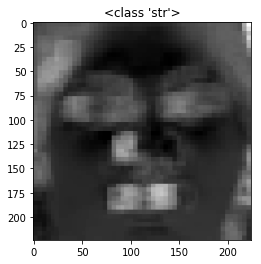

Name  pred = reshapen Y_pred
type:  <class 'numpy.ndarray'>
Dtype:  float32
shape:  (1, 50, 50, 272)


In [15]:
# shows the images stored in the second to last layer
showInfo(Y_pred,"Y_pred after dropout")
showInfo(Y_pred2,"Y_pred2 before dropout")
maxo = np.max(Y_pred2)
print(maxo)
Y_reshape = cv2.resize(Y_pred2.reshape(50,50,272),(224,224), interpolation = cv2.INTER_AREA)
Y_reshape_50 = cv2.resize(Y_pred2_50.reshape(50,50,272),(224,224), interpolation = cv2.INTER_AREA)
print(Y_reshape.shape[2])
showInfo(Y_reshape,'Y_reshape')
# cv2.imshow("test",Y_reshape[:,:,240])
# cv2.waitKey(0)
fig, axs = plt.subplots()
axs.set_title(str)
axs.imshow(Y_reshape[:,:,240], cmap='gray')#, interpolation='nearest');
plt.show()

    
 

pred = Y_pred.reshape(1,50,50,272)
showInfo(pred,"pred = reshapen Y_pred")
np.set_printoptions(threshold=np.nan)
np.set_printoptions(suppress=True)
# print(Y_pred2[0,0,0,0:50])
# print("---------------------------")
# print(pred[0,0,0,0:50])

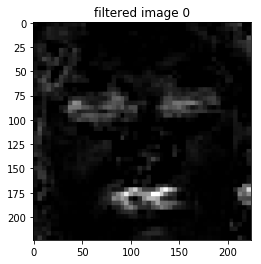

max  1.2497295
min  0.0


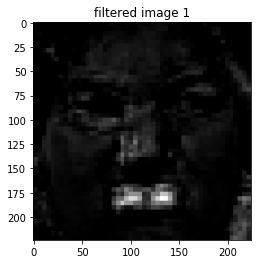

max  1.5740558
min  0.0


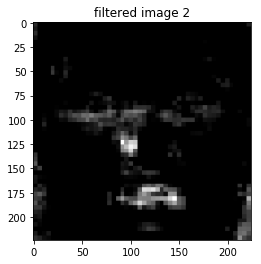

max  0.91070586
min  0.0


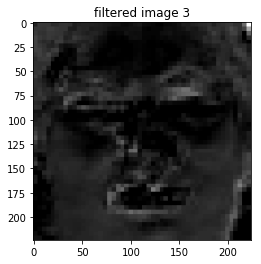

max  1.5898921
min  0.0


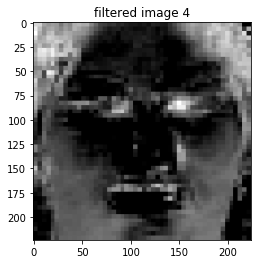

max  0.736642
min  0.0


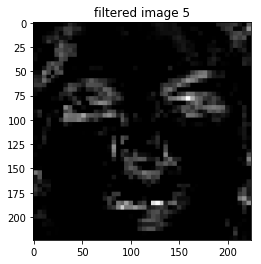

max  0.6909765
min  0.0


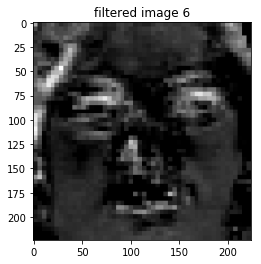

max  0.91481143
min  0.0


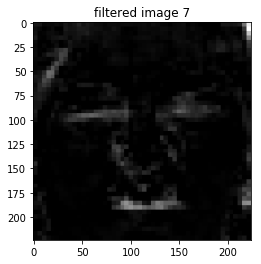

max  1.907254
min  0.0


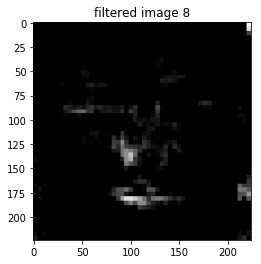

max  1.3065746
min  0.0


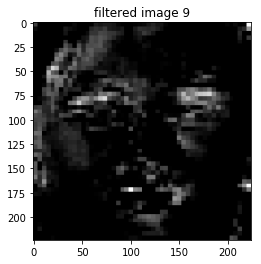

max  0.61653954
min  0.0


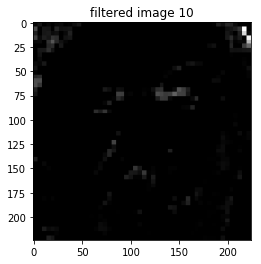

max  0.79109687
min  0.0


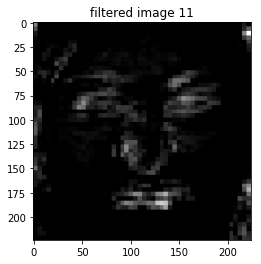

max  1.2053815
min  0.0


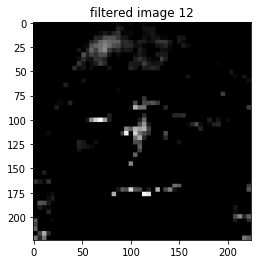

max  0.31282467
min  0.0


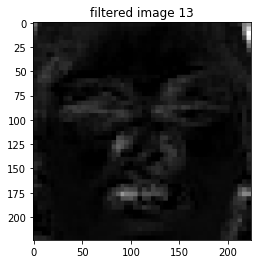

max  2.7556942
min  0.0


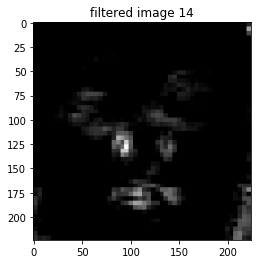

max  1.4189827
min  0.0


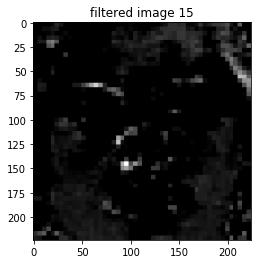

max  0.4356802
min  0.0


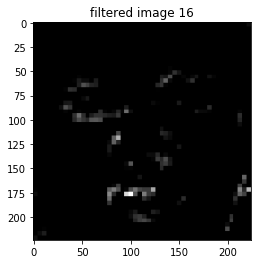

max  0.69069755
min  0.0


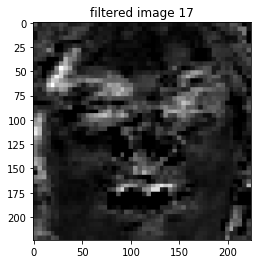

max  0.8003111
min  0.0


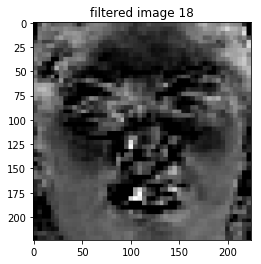

max  0.75107235
min  0.0


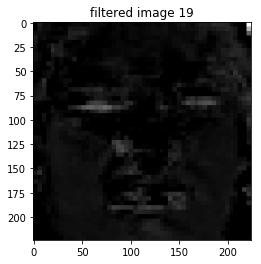

max  1.9783953
min  0.0


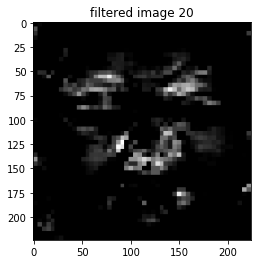

max  0.52321965
min  0.0


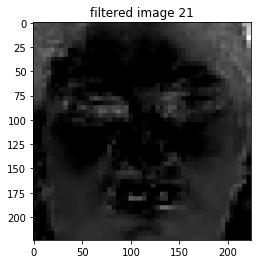

max  1.5797511
min  0.0


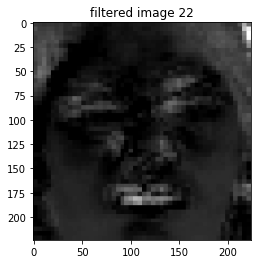

max  2.0150516
min  0.0


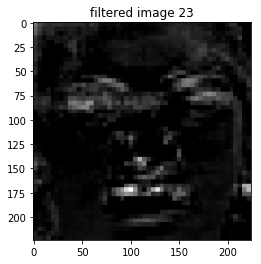

max  1.0310773
min  0.0


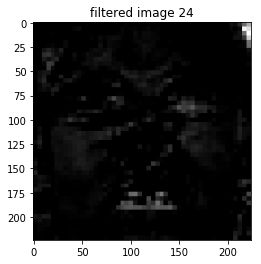

max  1.2434103
min  0.0


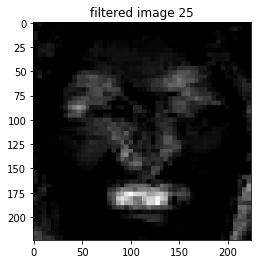

max  1.4954203
min  0.0


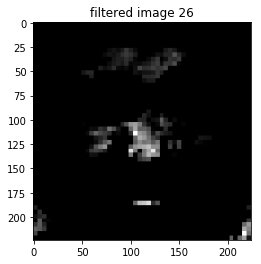

max  0.37587544
min  0.0


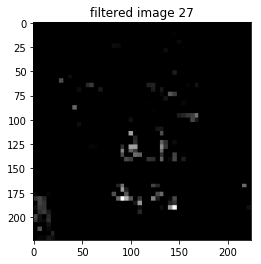

max  0.37846938
min  0.0


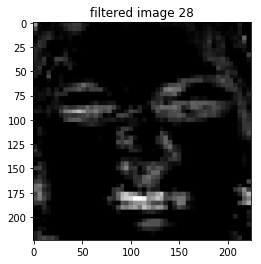

max  1.2061965
min  0.0


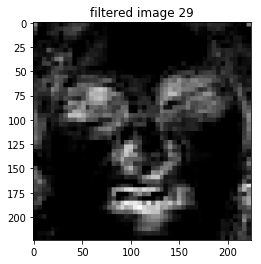

max  0.9817143
min  0.0


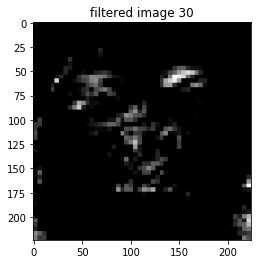

max  0.5066275
min  0.0


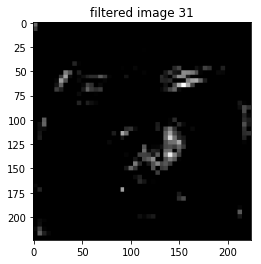

max  0.5071255
min  0.0


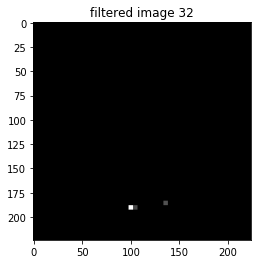

max  0.25624624
min  0.0


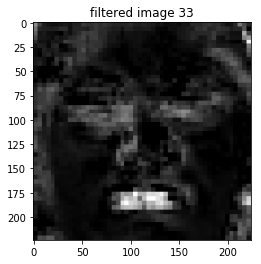

max  1.2488421
min  0.0


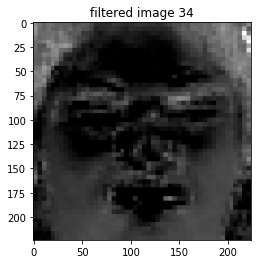

max  1.312322
min  0.0


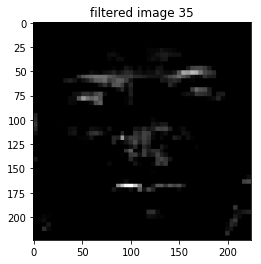

max  0.8015816
min  0.0


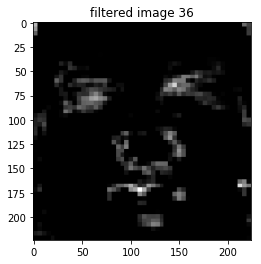

max  0.7138175
min  0.0


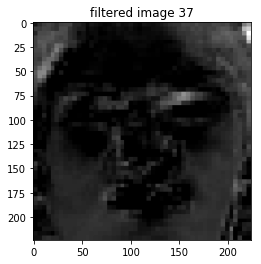

max  1.379141
min  0.0


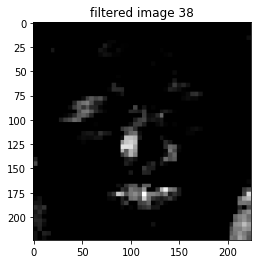

max  0.85127085
min  0.0


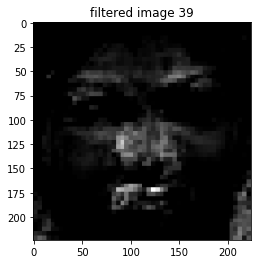

max  1.0708078
min  0.0


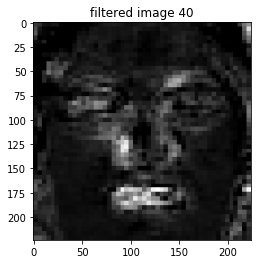

max  1.0218933
min  0.0


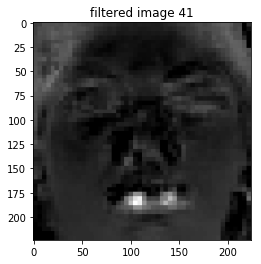

max  2.1248436
min  0.0


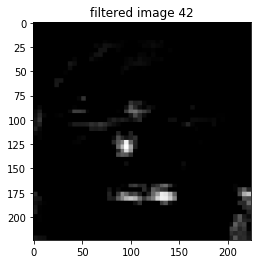

max  1.0494987
min  0.0


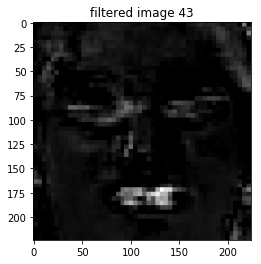

max  1.3633666
min  0.0


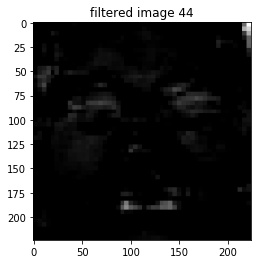

max  1.5693427
min  0.0


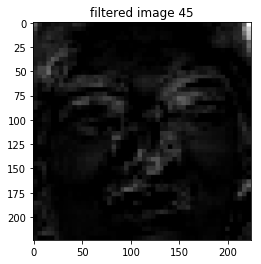

max  1.9015357
min  0.0


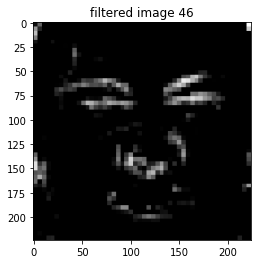

max  0.5671691
min  0.0


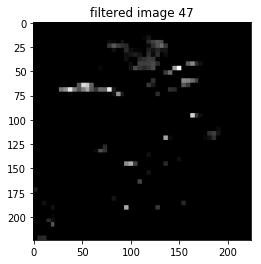

max  0.15311803
min  0.0


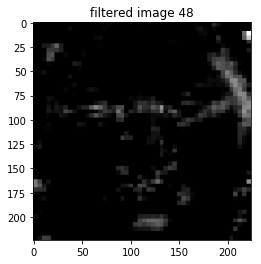

max  0.78057694
min  0.0


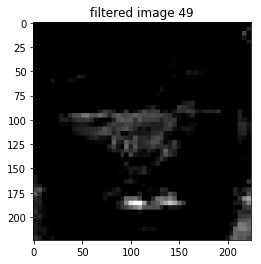

max  1.4065658
min  0.0


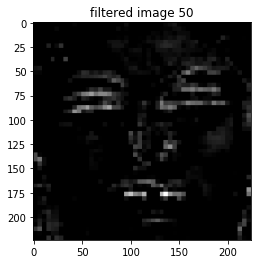

max  0.7094729
min  0.0


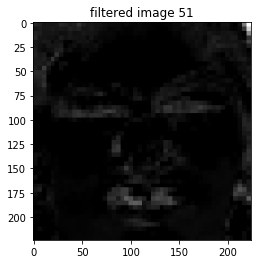

max  2.3452687
min  0.0


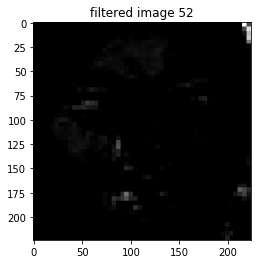

max  1.3735975
min  0.0


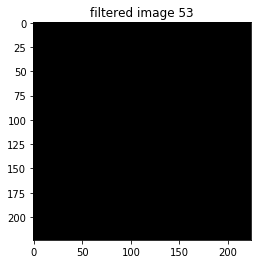

max  0.0
min  0.0


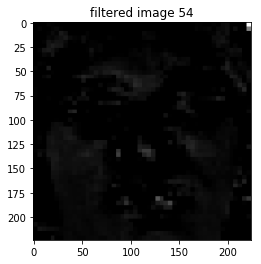

max  1.5747787
min  0.0


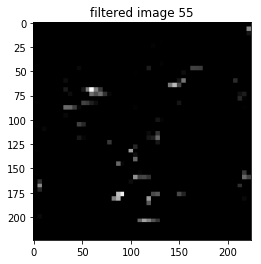

max  0.32081732
min  0.0


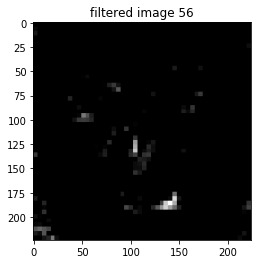

max  0.49594855
min  0.0


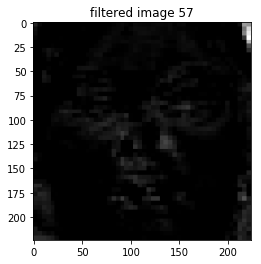

max  2.3784702
min  0.0


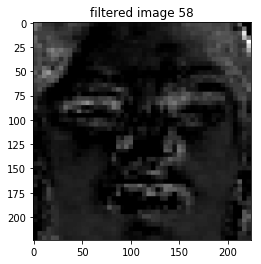

max  1.1695083
min  0.0


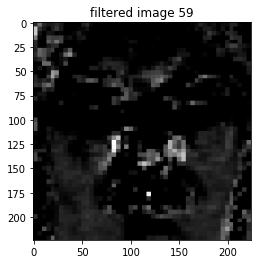

max  0.45469463
min  0.0


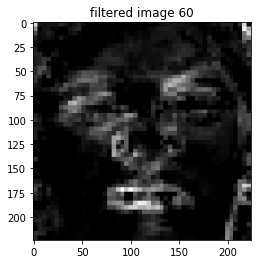

max  0.97202253
min  0.0


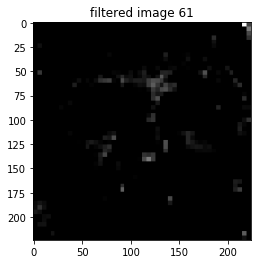

max  0.5290594
min  0.0


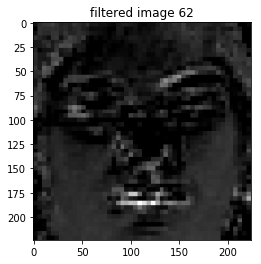

max  1.0615917
min  0.0


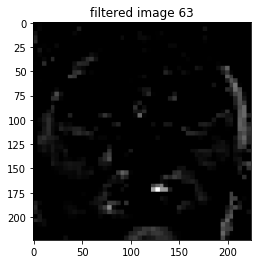

max  0.55496544
min  0.0


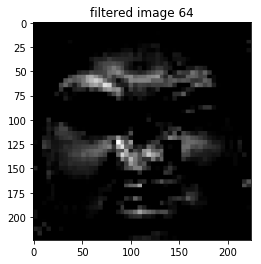

max  0.6268278
min  0.0


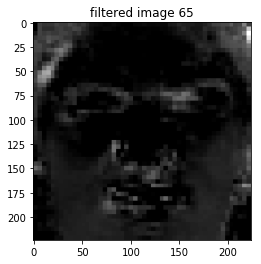

max  1.3427324
min  0.0


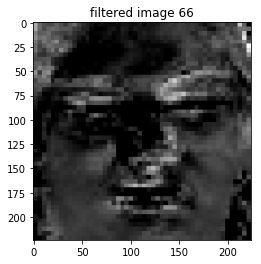

max  0.811229
min  0.0


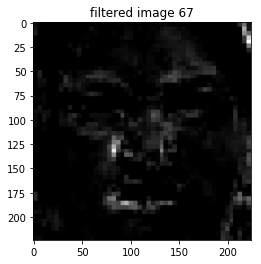

max  1.2668093
min  0.0


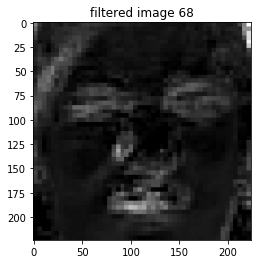

max  1.8808395
min  0.0


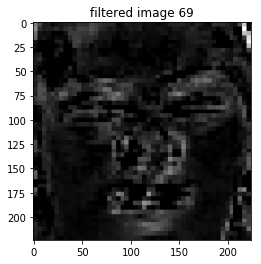

max  0.94212806
min  0.0


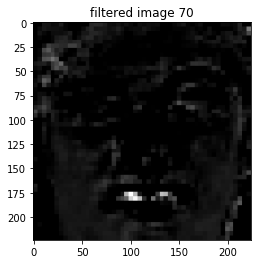

max  1.067911
min  0.0


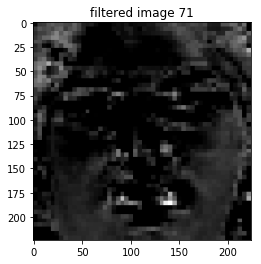

max  0.64816755
min  0.0


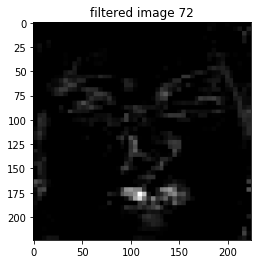

max  1.321948
min  0.0


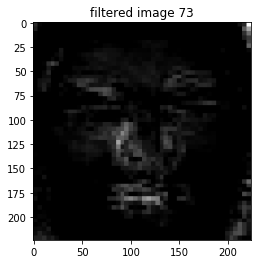

max  1.5324695
min  0.0


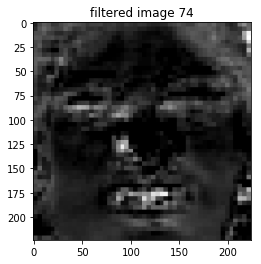

max  1.0561216
min  0.0


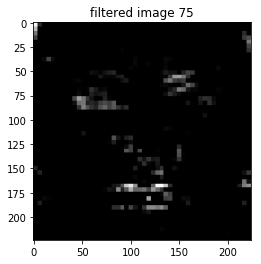

max  0.61875707
min  0.0


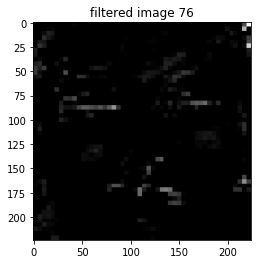

max  0.72851664
min  0.0


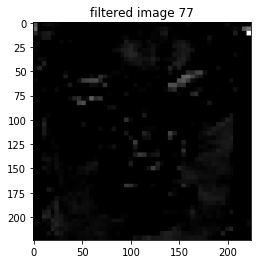

max  0.78815407
min  0.0


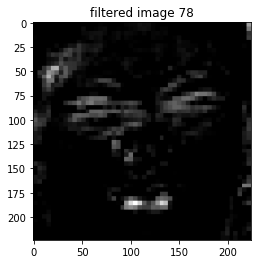

max  1.1663929
min  0.0


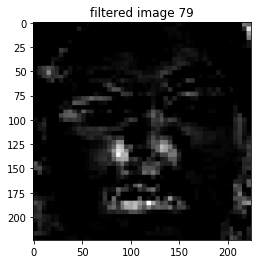

max  0.93483347
min  0.0


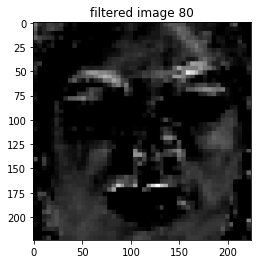

max  0.6707749
min  0.0


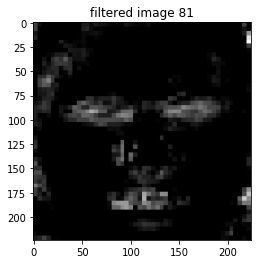

max  1.1113025
min  0.0


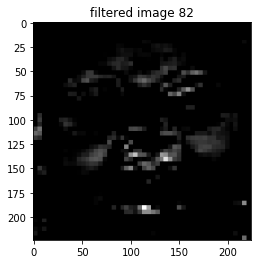

max  0.5200256
min  0.0


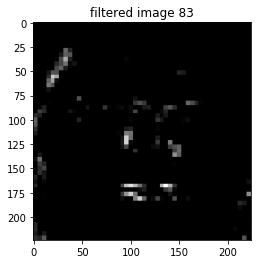

max  0.583618
min  0.0


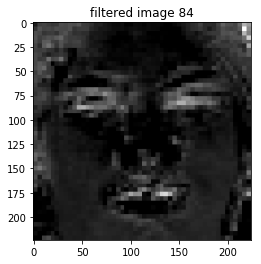

max  1.2140013
min  0.0


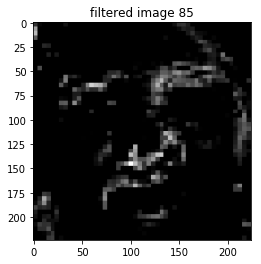

max  0.380111
min  0.0


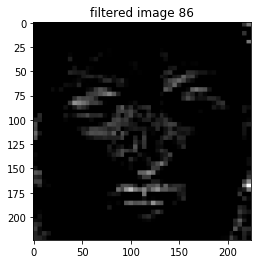

max  0.8392964
min  0.0


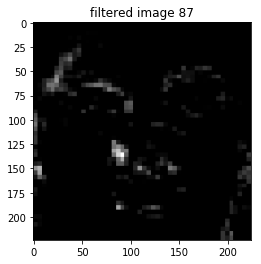

max  0.7372587
min  0.0


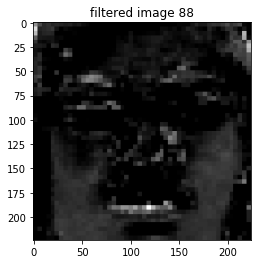

max  0.7442086
min  0.0


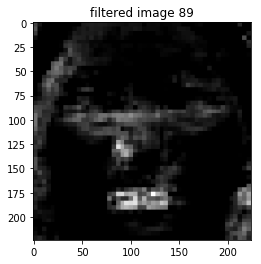

max  1.3008157
min  0.0


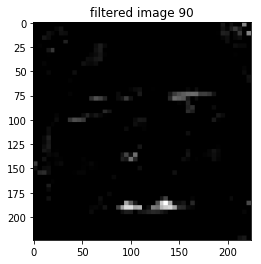

max  0.69101626
min  0.0


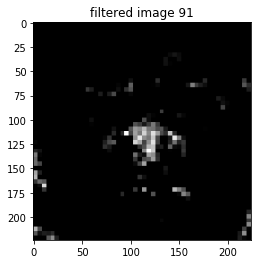

max  0.32382903
min  0.0


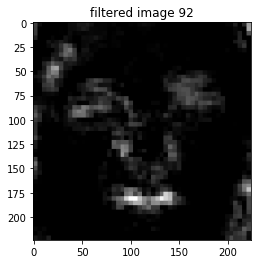

max  1.3086149
min  0.0


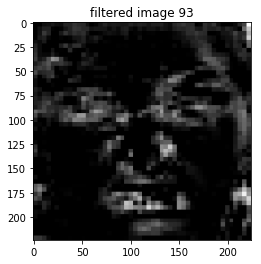

max  0.7486014
min  0.0


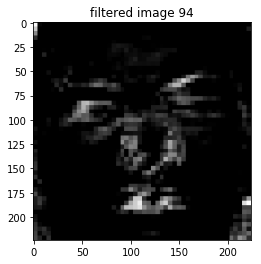

max  0.8795625
min  0.0


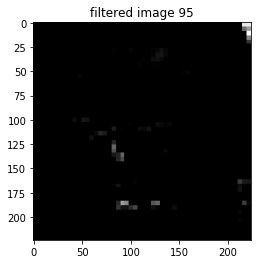

max  0.80957437
min  0.0


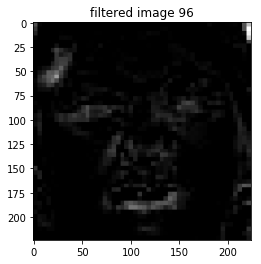

max  1.7825334
min  0.0


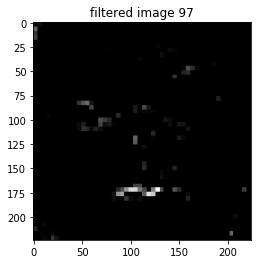

max  0.50432414
min  0.0


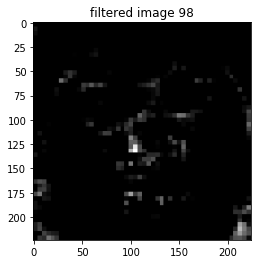

max  0.5238245
min  0.0


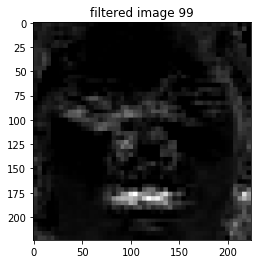

max  1.5249388
min  0.0


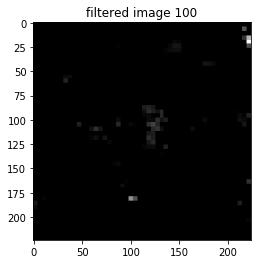

max  0.60949624
min  0.0


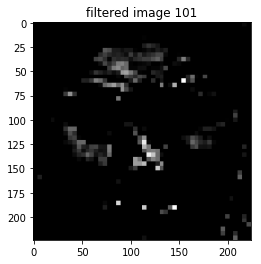

max  0.2087402
min  0.0


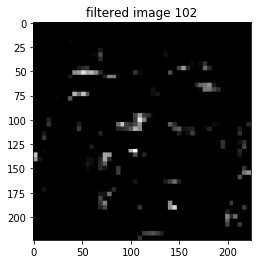

max  0.2197889
min  0.0


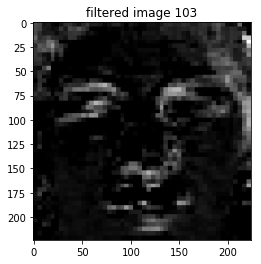

max  0.6734085
min  0.0


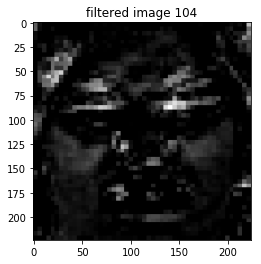

max  0.59898186
min  0.0


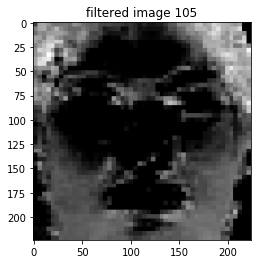

max  0.5988606
min  0.0


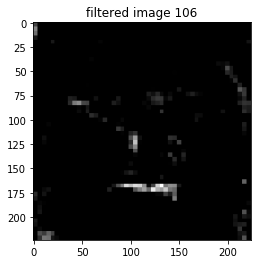

max  0.6426965
min  0.0


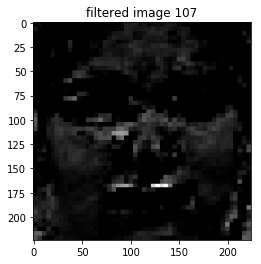

max  0.6823117
min  0.0


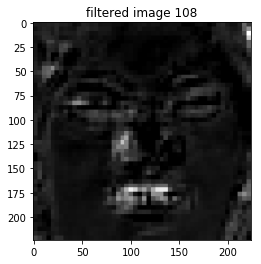

max  1.5821017
min  0.0


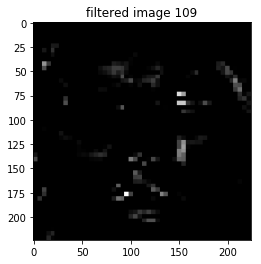

max  0.42000866
min  0.0


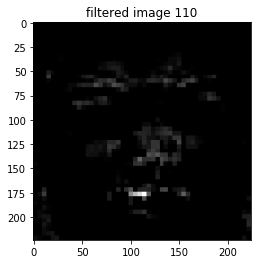

max  0.97592604
min  0.0


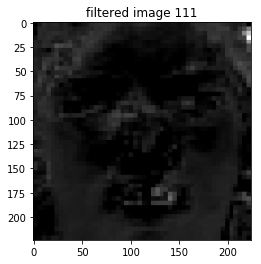

max  1.8418283
min  0.0


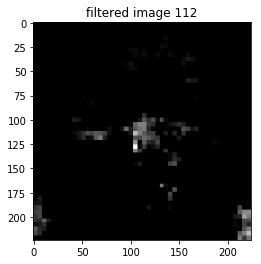

max  0.4215912
min  0.0


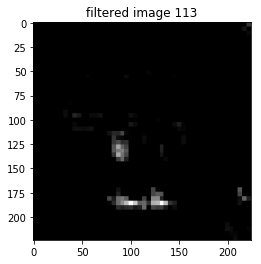

max  1.1699508
min  0.0


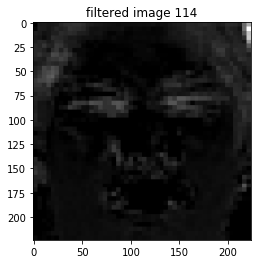

max  1.8503988
min  0.0


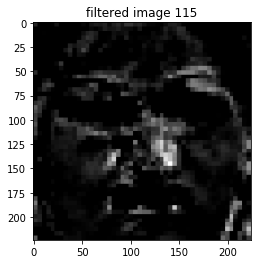

max  0.5885111
min  0.0


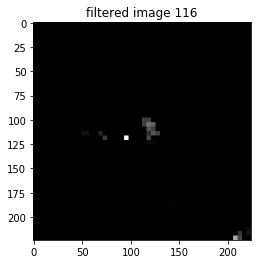

max  0.15092893
min  0.0


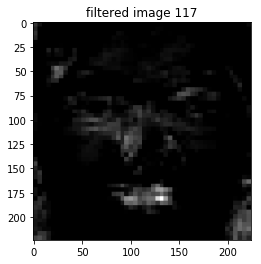

max  1.4624431
min  0.0


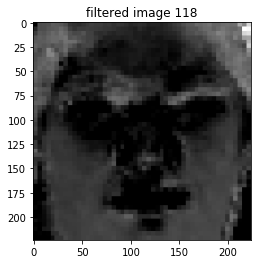

max  1.495367
min  0.0


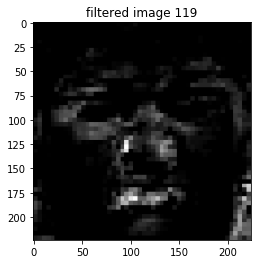

max  0.9899036
min  0.0


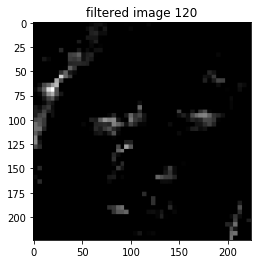

max  0.55591893
min  0.0


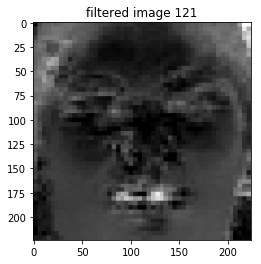

max  1.6948868
min  0.0


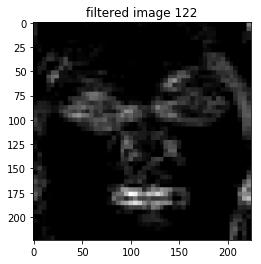

max  1.3194866
min  0.0


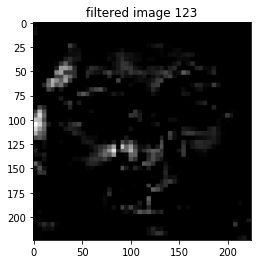

max  0.56262106
min  0.0


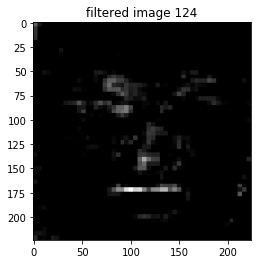

max  0.8417561
min  0.0


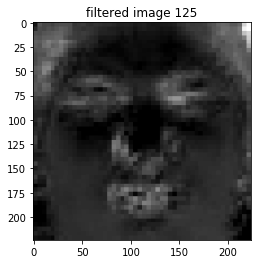

max  2.1156683
min  0.0


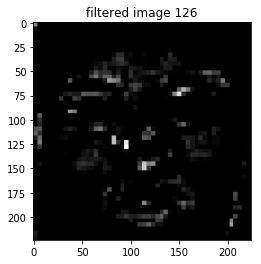

max  0.3767227
min  0.0


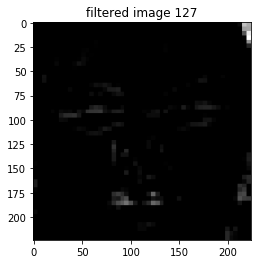

max  1.7783258
min  0.0


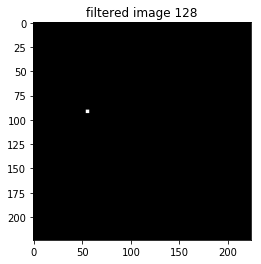

max  0.02676141
min  0.0


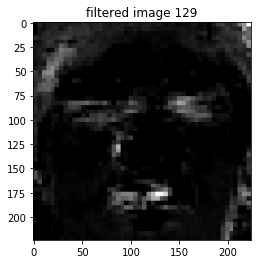

max  1.198071
min  0.0


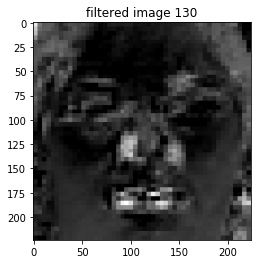

max  1.1561759
min  0.0


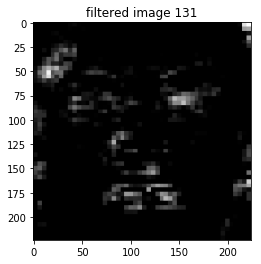

max  0.7215696
min  0.0


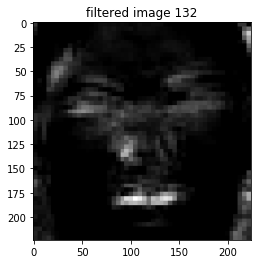

max  2.013324
min  0.0


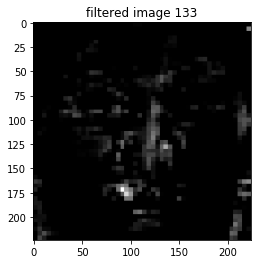

max  0.7655967
min  0.0


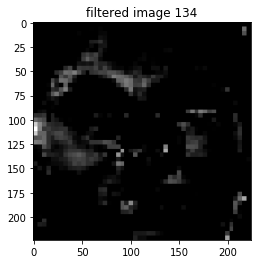

max  0.43455106
min  0.0


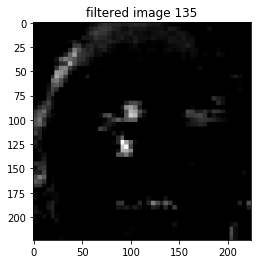

max  0.8024875
min  0.0


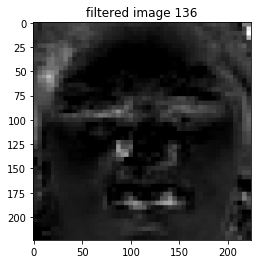

max  1.8032733
min  0.0


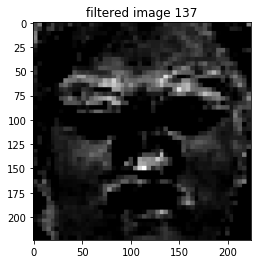

max  0.57809365
min  0.0


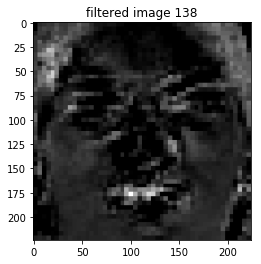

max  0.7827569
min  0.0


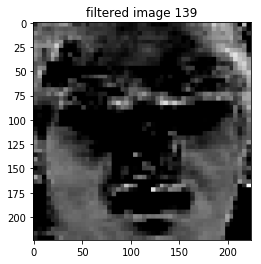

max  0.5427972
min  0.0


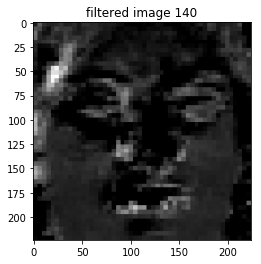

max  0.8974347
min  0.0


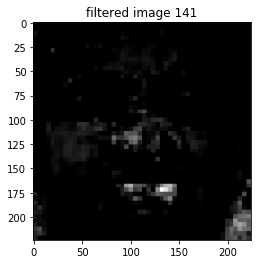

max  0.8155446
min  0.0


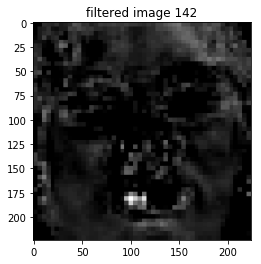

max  0.8445787
min  0.0


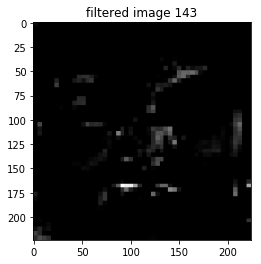

max  0.65140915
min  0.0


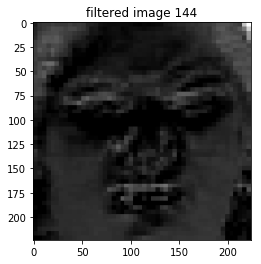

max  1.7572179
min  0.0


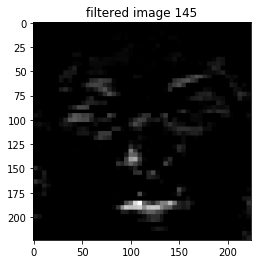

max  1.0328977
min  0.0


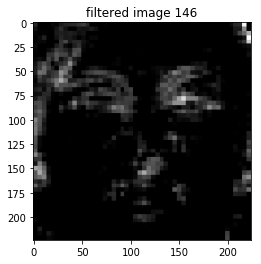

max  0.81944644
min  0.0


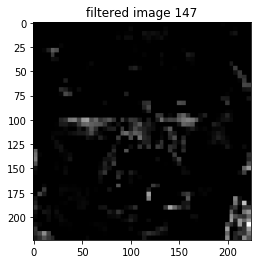

max  0.49315435
min  0.0


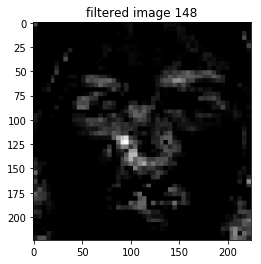

max  0.8902879
min  0.0


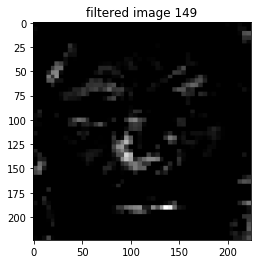

max  0.6809424
min  0.0


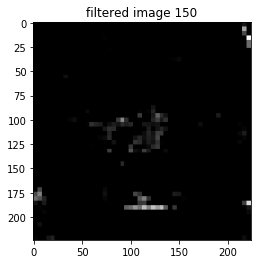

max  0.643653
min  0.0


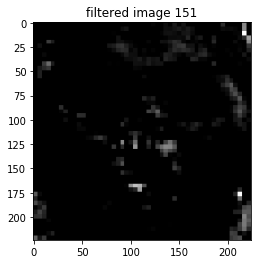

max  0.49526298
min  0.0


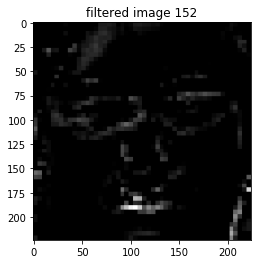

max  0.8390079
min  0.0


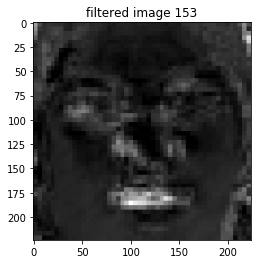

max  1.7373368
min  0.0


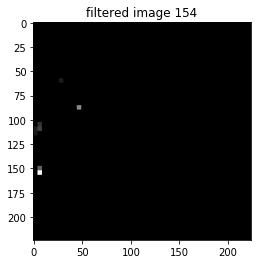

max  0.18152219
min  0.0


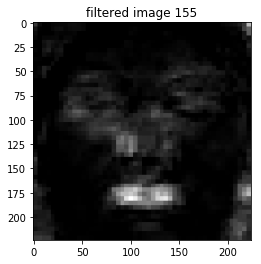

max  2.3296902
min  0.0


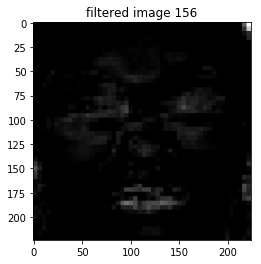

max  2.0772958
min  0.0


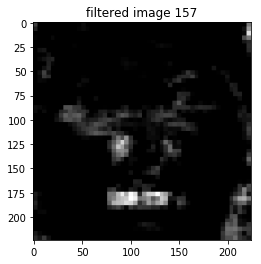

max  1.1726702
min  0.0


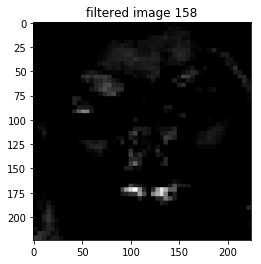

max  0.98267764
min  0.0


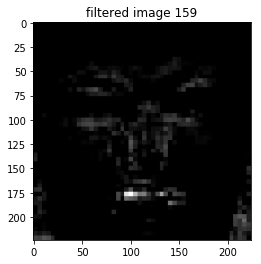

max  0.95710474
min  0.0


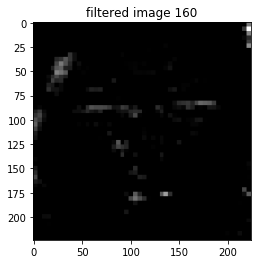

max  0.9947167
min  0.0


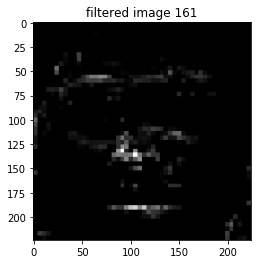

max  0.61833864
min  0.0


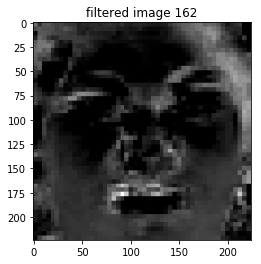

max  1.1211429
min  0.0


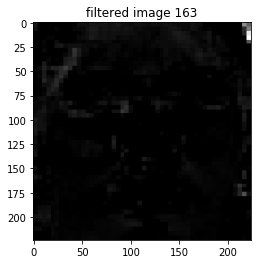

max  1.9843928
min  0.0


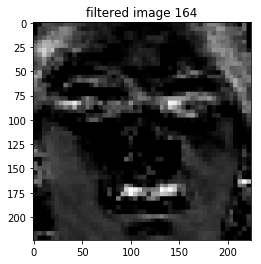

max  0.6619744
min  0.0


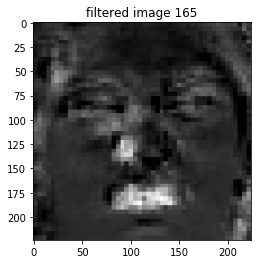

max  1.5964628
min  0.0


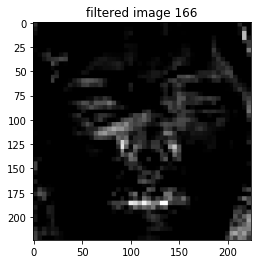

max  0.9038724
min  0.0


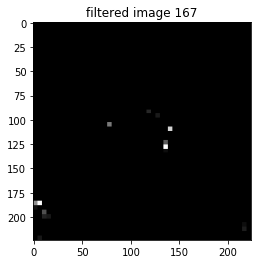

max  0.13511758
min  0.0


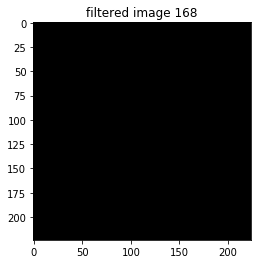

max  0.0
min  0.0


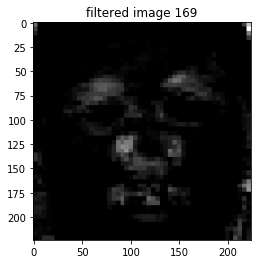

max  1.6564178
min  0.0


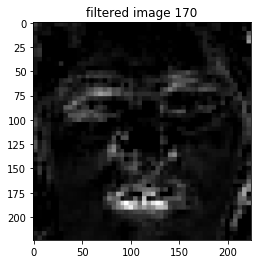

max  1.1397442
min  0.0


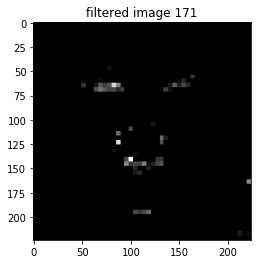

max  0.3585863
min  0.0


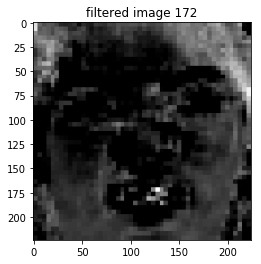

max  0.72429365
min  0.0


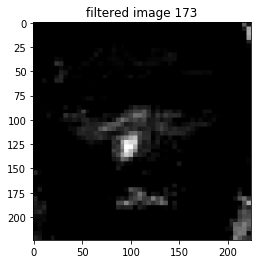

max  1.3297912
min  0.0


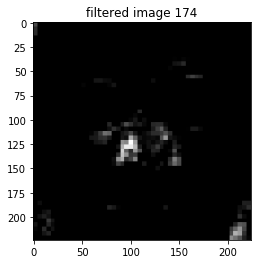

max  0.65259767
min  0.0


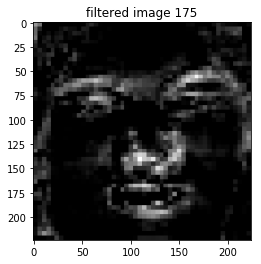

max  0.70290554
min  0.0


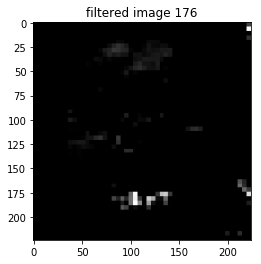

max  0.6787692
min  0.0


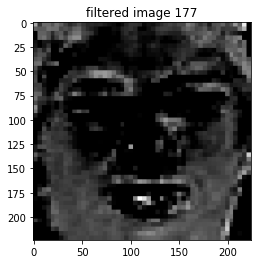

max  0.53215945
min  0.0


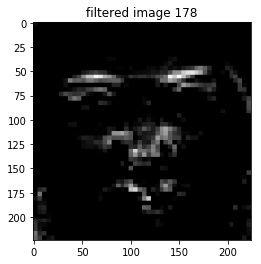

max  0.5898036
min  0.0


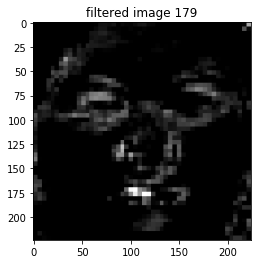

max  0.82884735
min  0.0


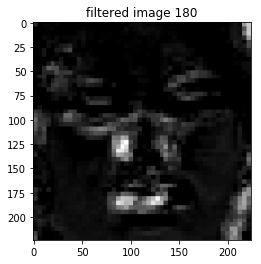

max  1.1878871
min  0.0


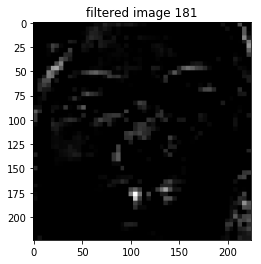

max  0.73759574
min  0.0


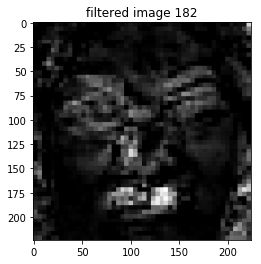

max  0.88374907
min  0.0


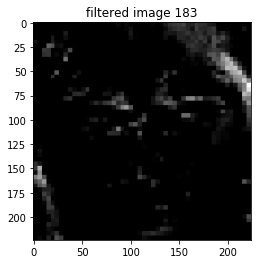

max  0.54075366
min  0.0


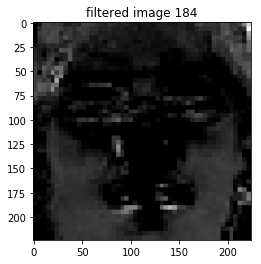

max  1.0522774
min  0.0


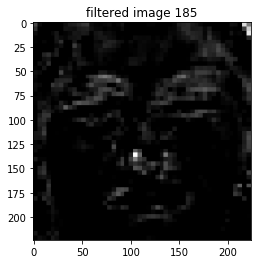

max  0.93233037
min  0.0


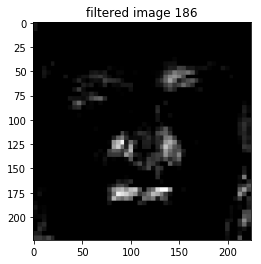

max  0.8882042
min  0.0


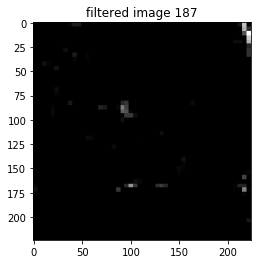

max  0.6691576
min  0.0


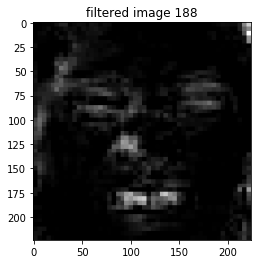

max  1.5027647
min  0.0


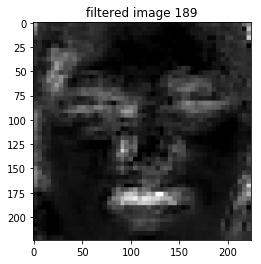

max  1.5261595
min  0.0


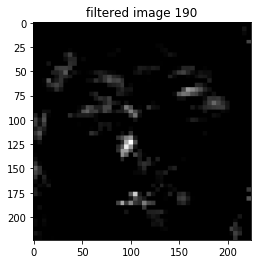

max  0.7964361
min  0.0


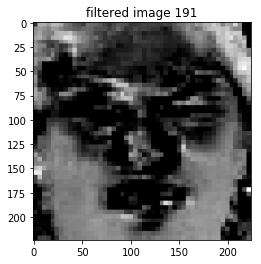

max  0.56436086
min  0.0


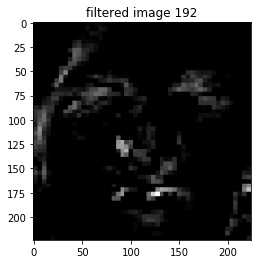

max  0.7924905
min  0.0


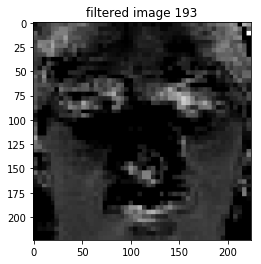

max  0.70016676
min  0.0


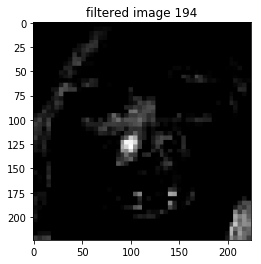

max  0.8403572
min  0.0


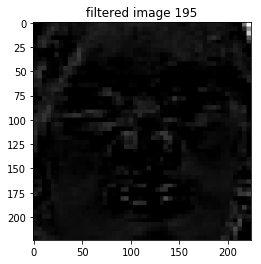

max  1.7228919
min  0.0


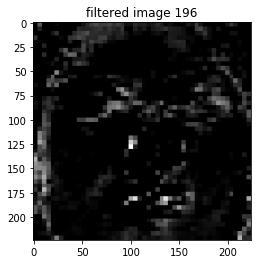

max  0.46747848
min  0.0


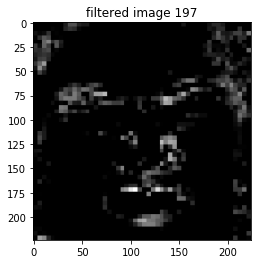

max  0.44011942
min  0.0


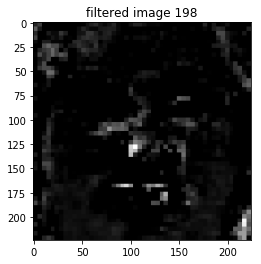

max  0.54469675
min  0.0


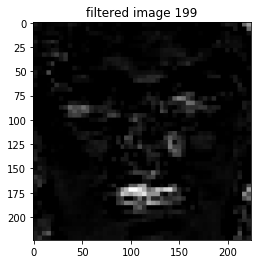

max  1.107759
min  0.0


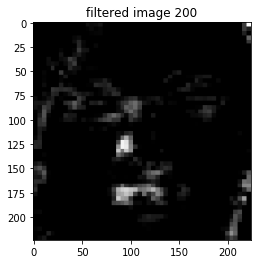

max  1.0443105
min  0.0


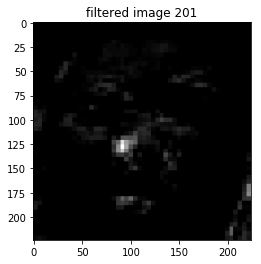

max  1.2551057
min  0.0


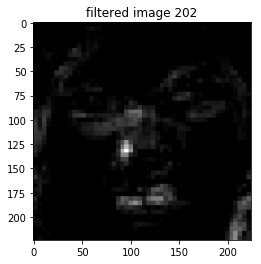

max  1.6200271
min  0.0


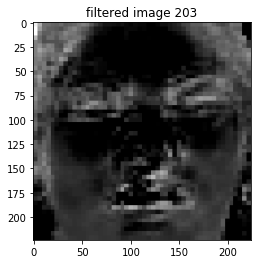

max  0.95514596
min  0.0


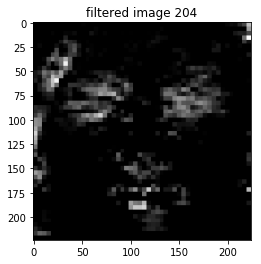

max  0.66370976
min  0.0


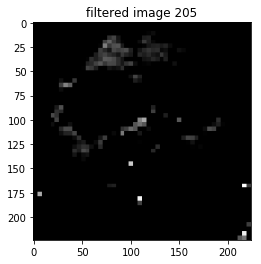

max  0.23355064
min  0.0


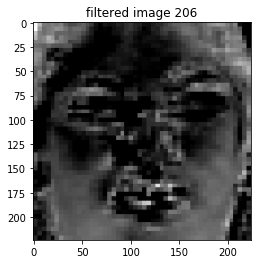

max  0.8360736
min  0.0


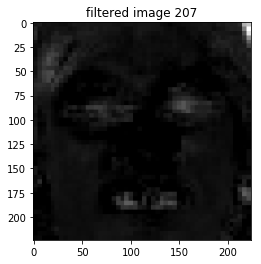

max  2.4327843
min  0.0


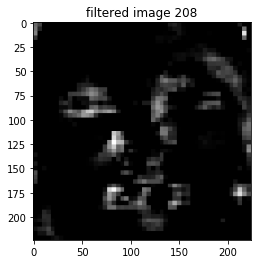

max  1.058716
min  0.0


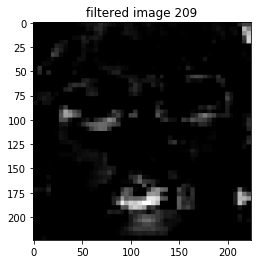

max  1.2066383
min  0.0


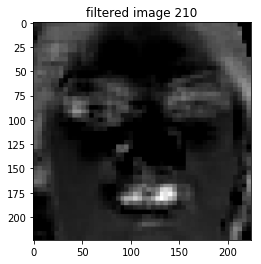

max  2.1769059
min  0.0


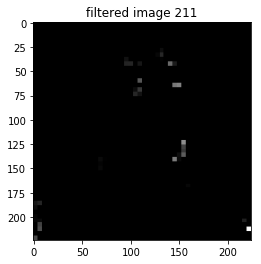

max  0.1641781
min  0.0


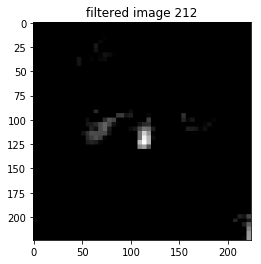

max  0.732474
min  0.0


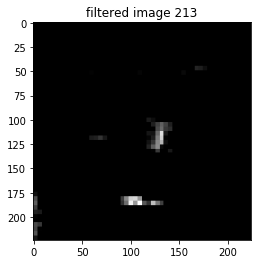

max  0.5312394
min  0.0


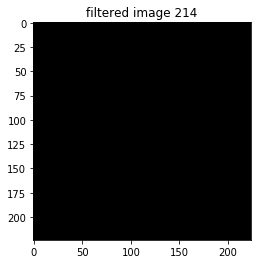

max  0.0
min  0.0


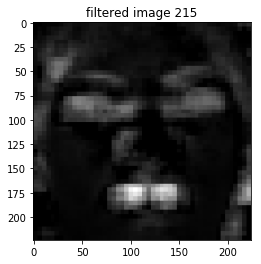

max  3.205268
min  0.0


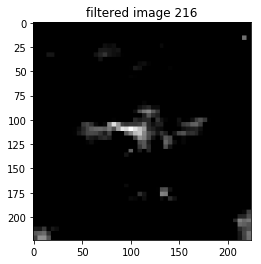

max  0.8290585
min  0.0


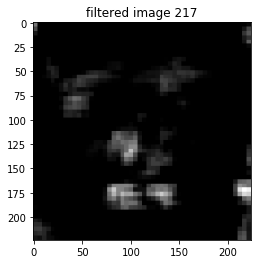

max  2.2739556
min  0.0


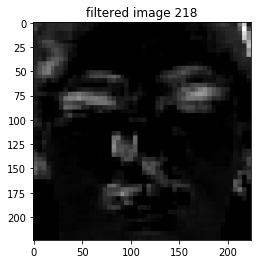

max  2.1843371
min  0.0


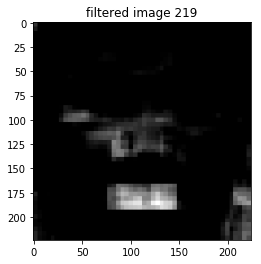

max  2.9715958
min  0.0


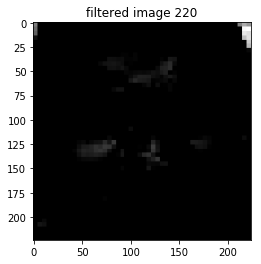

max  1.4685658
min  0.0


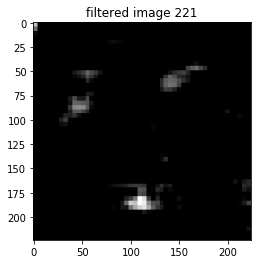

max  1.1614313
min  0.0


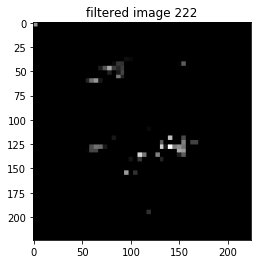

max  0.18421517
min  0.0


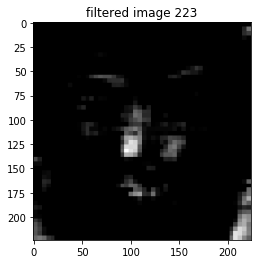

max  1.4130971
min  0.0


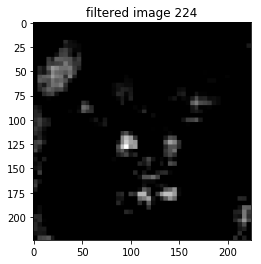

max  1.0885273
min  0.0


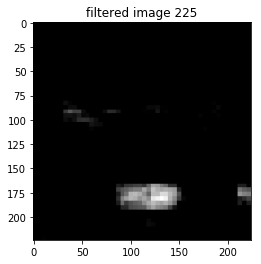

max  2.023711
min  0.0


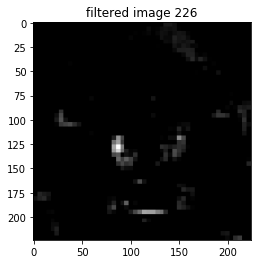

max  0.9455758
min  0.0


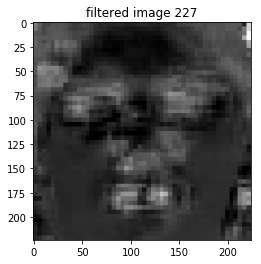

max  2.3681602
min  0.0


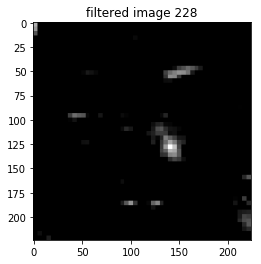

max  1.0177296
min  0.0


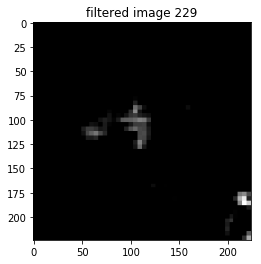

max  0.82345533
min  0.0


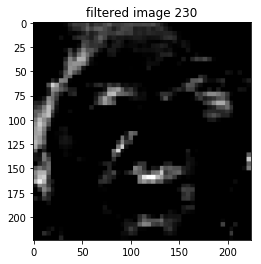

max  0.6817388
min  0.0


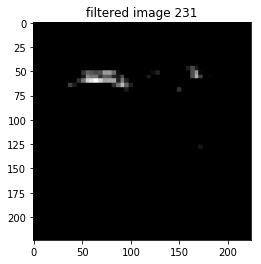

max  0.3511893
min  0.0


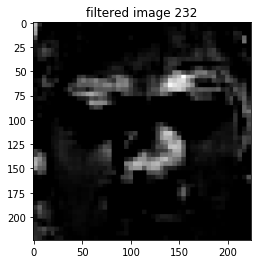

max  0.973612
min  0.0


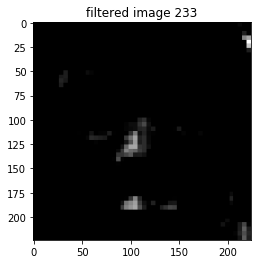

max  1.5983784
min  0.0


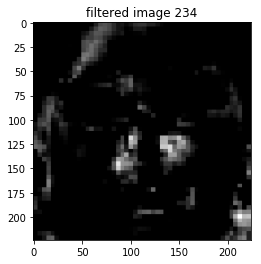

max  0.7779204
min  0.0


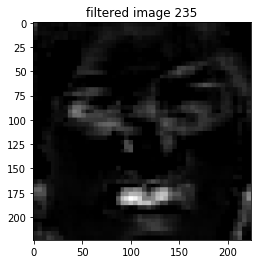

max  2.2251484
min  0.0


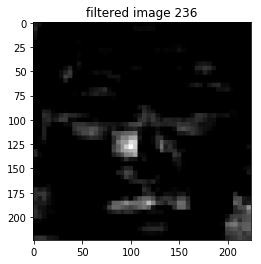

max  1.7959793
min  0.0


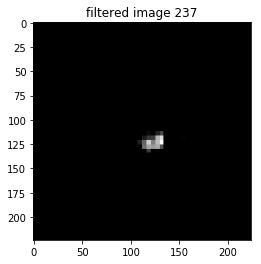

max  0.41251493
min  0.0


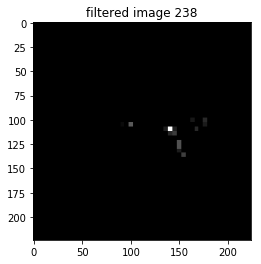

max  0.19967279
min  0.0


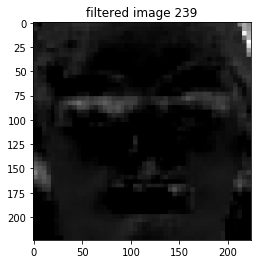

max  2.9443033
min  0.0


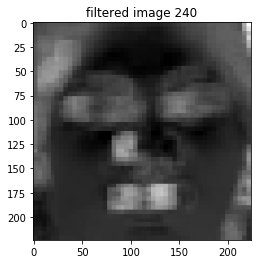

max  4.476562
min  0.0


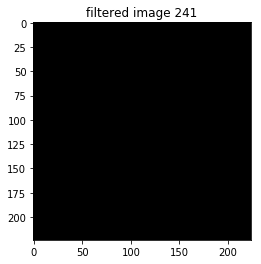

max  0.0
min  0.0


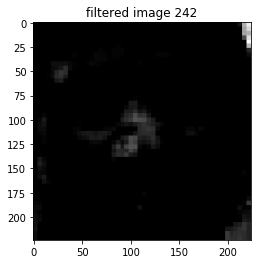

max  2.865642
min  0.0


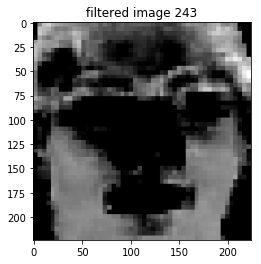

max  0.7240016
min  0.0


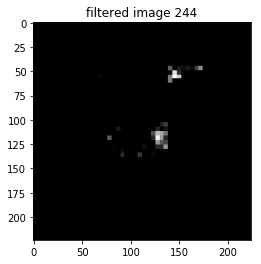

max  0.27733284
min  0.0


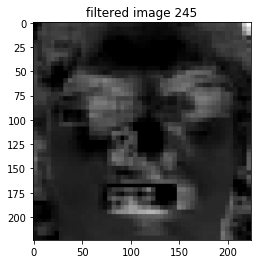

max  2.4397607
min  0.0


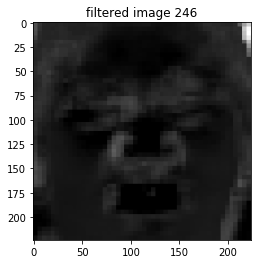

max  5.647466
min  0.0


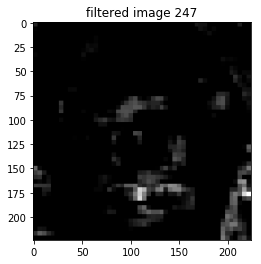

max  1.1917909
min  0.0


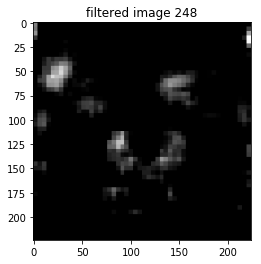

max  1.517225
min  0.0


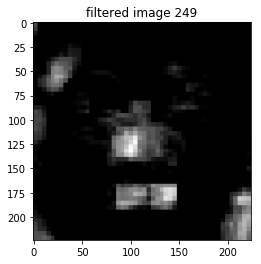

max  1.9677078
min  0.0


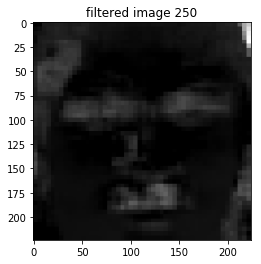

max  5.0194716
min  0.0


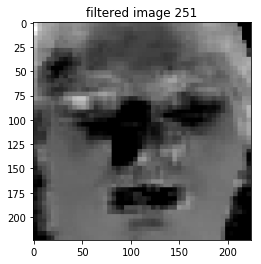

max  2.3940423
min  0.0


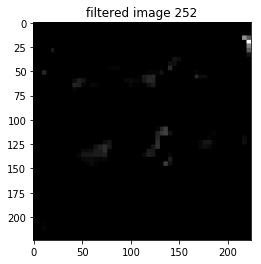

max  1.3048563
min  0.0


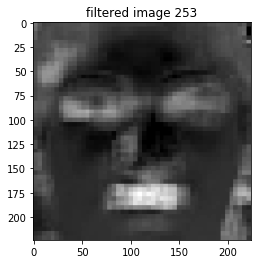

max  3.7455716
min  0.0


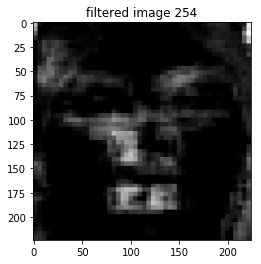

max  2.1101797
min  0.0


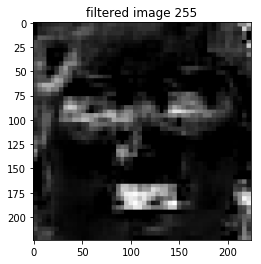

max  1.397218
min  0.0


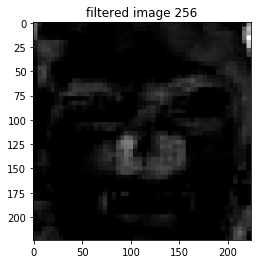

max  2.6420183
min  0.0


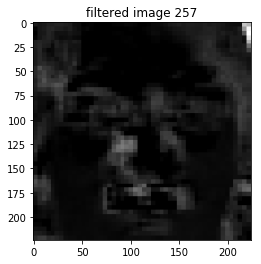

max  2.9309607
min  0.0


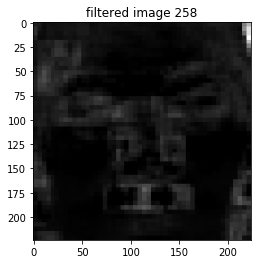

max  3.7747498
min  0.0


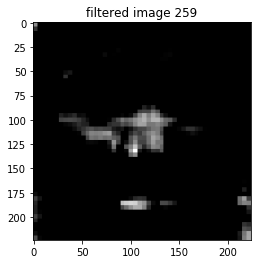

max  1.1747662
min  0.0


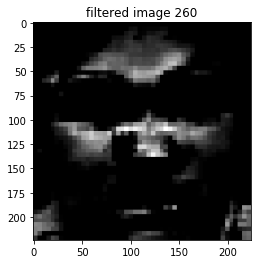

max  0.69214725
min  0.0


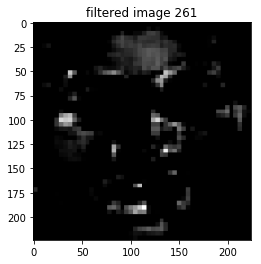

max  0.5373318
min  0.0


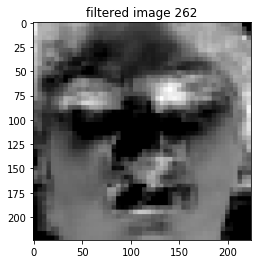

max  1.6280087
min  0.0


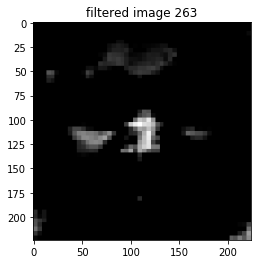

max  0.6753668
min  0.0


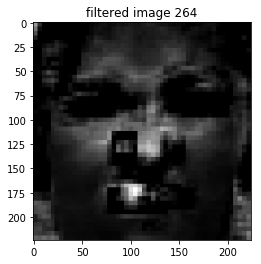

max  1.7680856
min  0.0


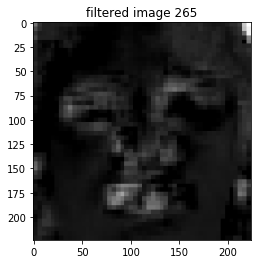

max  2.7288215
min  0.0


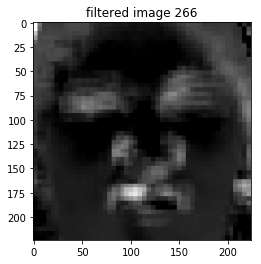

max  3.145257
min  0.0


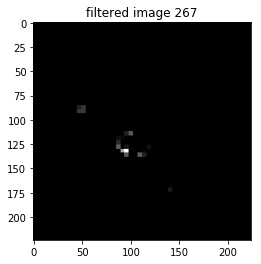

max  0.5063352
min  0.0


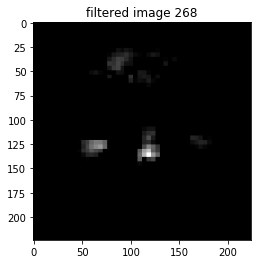

max  0.55534124
min  0.0


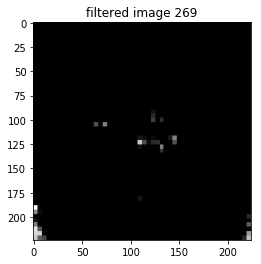

max  0.21844655
min  0.0


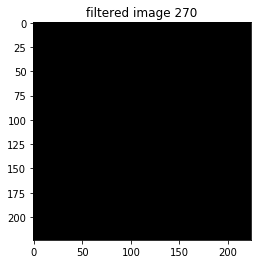

max  0.0
min  0.0


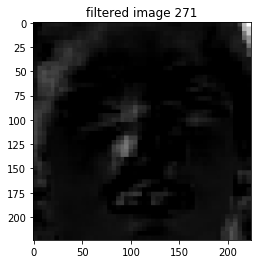

max  4.311064
min  0.0


In [20]:
selection = []
# shows all images stored in the second to last layer
for i in range(0,Y_reshape.shape[2]):
    str = "filtered image " +  repr(i)
    fig, axs = plt.subplots()
    axs.set_title(str)
    axs.imshow(Y_reshape[:,:,i], cmap='gray')#, interpolation='nearest');
    plt.show() 
    print("max ",np.max(Y_reshape[:,:,i]))
    print("min ", np.min(Y_reshape[:,:,i]))
#     if(Y_reshape[:,:,i].any() >=  1):       
# #         print(Y_reshape[:,:,1])
#     print("max found")

#     cv2.imshow(str,(Y_reshape[:,:,i]))
#     cv2.waitKey(0)
#     cv2.destroyAllWindows()


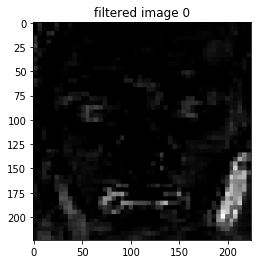

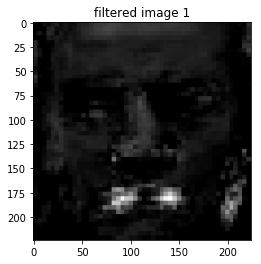

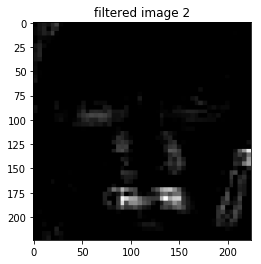

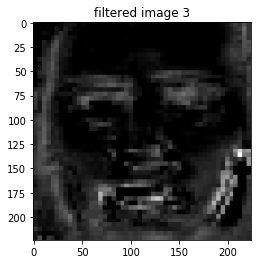

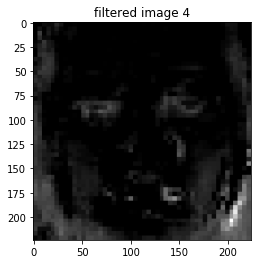

...

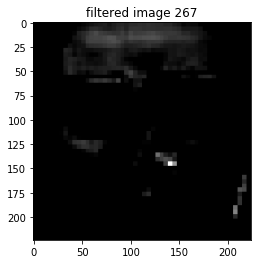

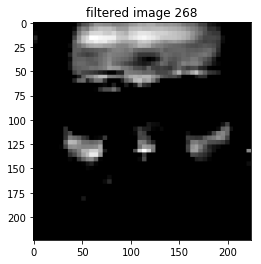

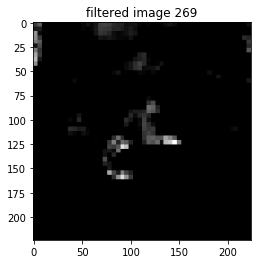

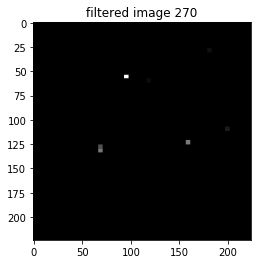

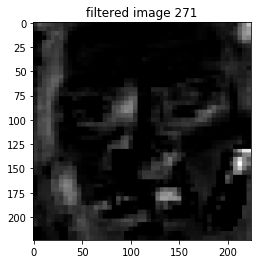

In [21]:
# shows all images stored in the second to last layer
for i in range(0,Y_reshape_50.shape[2]):
                 
    str = "filtered image " +  repr(i)
#     aparrently plt is more reliable to display images in jupytere notebook  then cv2
    fig, axs = plt.subplots()
    axs.set_title(str)
    axs.imshow(Y_reshape_50[:,:,i], cmap='gray')#, interpolation='nearest');
    plt.show()

In [16]:
#determine the emotion of the image
def emotionParse(emotionNr):
    if(emotionNr == 0):
        emotion = 'Anger'
    elif(emotionNr == 1):
        emotion = 'Contempt'
    elif(emotionNr == 2):
        emotion = 'Disgust'
    elif(emotionNr == 3):
        emotion = 'Fear '
    elif(emotionNr == 4):
        emotion = 'Happy'
    elif(emotionNr == 5):
        emotion = 'Saddness'
    else:
        emotion = 'Surprise'
    return emotion


<class 'numpy.ndarray'>
Name  weights
type:  <class 'numpy.ndarray'>
Dtype:  float32
shape:  (680000, 7)
[-0.02426779  0.01906147 -0.01809155 -0.00829517  0.00523452  0.03273747
 -0.00174737]
[ 0.02028005  0.02345897 -0.01292278  0.00358047  0.02017989  0.00263044
  0.01224747]
[ 0.01555516 -0.02866572 -0.00964126  0.00573142 -0.01376486 -0.02001086
  0.01070189]
Name  Y_pred
type:  <class 'numpy.ndarray'>
Dtype:  float32
shape:  (1, 680000)
Name  elem
type:  <class 'numpy.ndarray'>
Dtype:  float64
shape:  (7, 50, 50)
min before  -0.7829038500785828
max before 1.279060810804367
max normalised 0.9012627498770392
min normalised 0.0


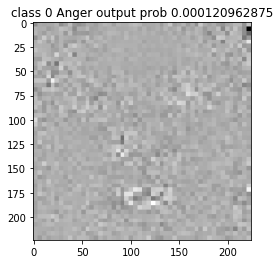

max resized  0.9012627498770392
min resized  0.0
max normalised 0.8410977507213205
min normalised 0.3938625140001928


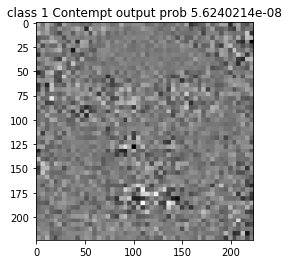

max resized  0.8410977507213205
min resized  0.3938625140001928
max normalised 1.0
min normalised 0.35619246855392844


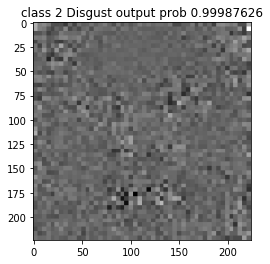

max resized  1.0
min resized  0.35619246855392844
max normalised 0.865556325470531
min normalised 0.37596957502301065


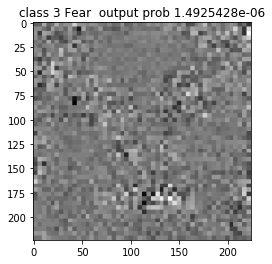

max resized  0.865556325470531
min resized  0.37596957502301065
max normalised 0.996926312706004
min normalised 0.3586877293595003


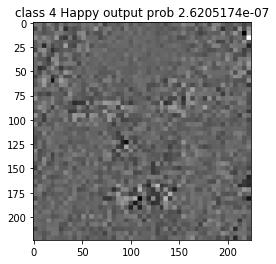

max resized  0.996926312706004
min resized  0.3586877293595003
max normalised 0.8980430171760163
min normalised 0.3376574703495553


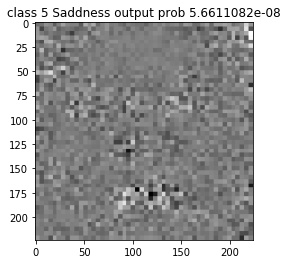

max resized  0.8980430171760163
min resized  0.3376574703495553
max normalised 0.9521405379946516
min normalised 0.27490901928016065


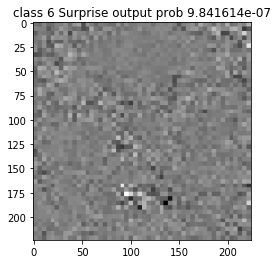

max resized  0.9521405379946516
min resized  0.27490901928016065
Name  UnKnown
type:  <class 'numpy.ndarray'>
Dtype:  float64
shape:  (7, 50, 50)


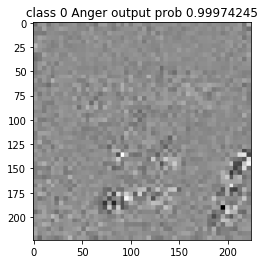

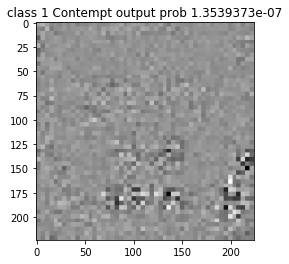

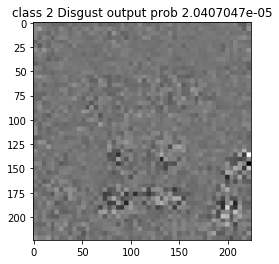

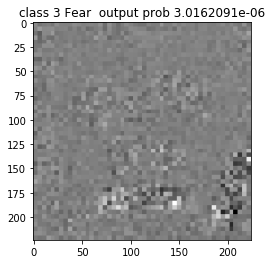

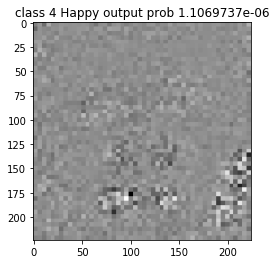

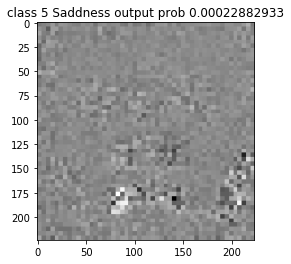

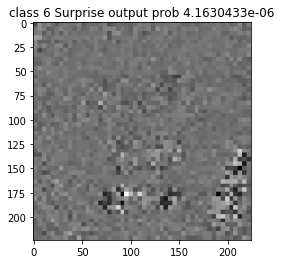

Name  output
type:  <class 'numpy.ndarray'>
Dtype:  float64
shape:  (7,)
[   11.0337584      0.00512938 91236.31803717     0.13619357
     0.02390368     0.005165       0.0898027 ]
91247.61198990115
my output,  [0.00012092 0.00000006 0.99987623 0.00000149 0.00000026 0.00000006
 0.00000098]
real output  [[0.00012096 0.00000006 0.99987626 0.00000149 0.00000026 0.00000006
  0.00000098]]
Name  output
type:  <class 'numpy.ndarray'>
Dtype:  float64
shape:  (7,)
[5149.17162523    0.00069728    0.10514467    0.01554112    0.0057017
    1.17887622    0.02144988]
5150.49903608695
my output,  [0.99974228 0.00000014 0.00002041 0.00000302 0.00000111 0.00022889
 0.00000416]
real output  [[0.99974245 0.00000014 0.00002041 0.00000302 0.00000111 0.00022883
  0.00000416]]


In [28]:
# compare the self calculated output with the real output
weights= model1.get_weights(loss.W)
print(type(weights))
showInfo(weights,'weights')
print(weights[:20][0])
print(weights[2500:2520][0])
print(weights[:20][1])
showInfo(Y_pred,"Y_pred")

elem = np.zeros((7,50,50))
elem_pos = np.zeros((7,50,50))
elem_pos_1 = np.zeros((7,50,50))
norm = np.zeros((7,50,50))
showInfo(elem,"elem")

for i in range(0,7):
    elem[i] = np.sum(np.multiply(Y_pred,weights[:,i]).reshape(50,50,272),axis = 2)
print("min before ", np.min(elem))
for i in range(0,7):
    elem_pos[i] = elem[i]-(np.min(elem))
print("max before",np.max(elem_pos))    
for i in range(0,7):
#     elem_pos[i] = np.exp(elem[i]) # try the exponent
    norm[i] = elem_pos[i]/np.max(elem_pos) #bring weights between 0 and 1
    print("----------------------------------------------------------------")
    print("max normalised",np.max(norm[i]))
    print("min normalised", np.min(norm[i]))
    
    Y_norm = cv2.resize(norm[i],(224,224), interpolation = cv2.INTER_AREA)
    
    emot = emotionParse(i)
    stre= "class " + repr(i) + " " + emot + " output prob " + repr(Y_real[0][i] )
#     cv2.imshow(stre,Y_norm)
#     cv2.waitKey(0)
#     cv2.destroyAllWindows() 
    fig, axs = plt.subplots()
    axs.set_title(stre)
    axs.imshow(Y_norm, cmap='gray')#, interpolation='nearest');
    plt.show()
    print("max resized ",np.max(Y_norm))
    print("min resized ", np.min(Y_norm))
#     for x in range(0,elem[i].shape[0]):
#         for y in range(0,elem[i].shape[1]):
#             if(elem[i][x][y] > 0 ):
#                 elem_pos_1[i][x][y] = elem[i][x][y]
#             else:
#                 elem_pos_1[i][x][y] = 0 
    
#     norm_1 = elem_pos[i]/np.max(elem_pos)
    
#     Y_norm_1 = cv2.resize(norm_1,(224,224), interpolation = cv2.INTER_AREA)
#     stre= "class " + repr(i)
#     cv2.imshow(stre,Y_norm_1)
#     cv2.waitKey(0)
#     cv2.destroyAllWindows() 
    
#     showInfo(elem[i],'elem')



In [ ]:
#-------------instance 50 

elem_50 = np.zeros((7,50,50))
elem_pos_50 = np.zeros((7,50,50))
elem_pos_1_50 = np.zeros((7,50,50))
norm_50 = np.zeros((7,50,50))
showInfo(elem)

for i in range(0,7):
    
    elem_50[i] = np.sum(np.multiply(Y_pred_50,weights[:,i]).reshape(50,50,272),axis = 2)
#     showInfo(temp)
#     elem[i] = np.multiply(temp,weights)
#     showInfo(elem_50[i])
for i in range(0,7):
    elem_pos_50[i] = elem_50[i]-(np.min(elem_50))
#     elem_pos[i] = np.exp(elem[i]) # try the exponent
for i in range(0,7):
    norm_50[i] = elem_pos_50[i]/np.max(elem_pos_50) #bring weights between 0 and 1
    
    Y_norm_50 = cv2.resize(norm_50[i],(224,224), interpolation = cv2.INTER_AREA)
    emot = emotionParse(i)
    stre_50= "class " + repr(i) + " " + emot + " output prob " + repr(Y_real_50[0][i] )
    
    fig, axs = plt.subplots()
    axs.set_title(stre_50)
    axs.imshow(Y_norm_50, cmap='gray')#, interpolation='nearest');
    plt.show()
    


output =np.exp(np.sum(np.sum(elem,axis = 1),axis = 1) )  
# output =np.exp(np.matmul(Y_pred,weights))

showInfo(output,"output")
summ = np.sum(output)
print(output)
print(summ)
print("my output, ",  output/summ)
print("real output " ,Y_real)

output_50 =np.exp(np.sum(np.sum(elem_50,axis = 1),axis = 1) )  
# output =np.exp(np.matmul(Y_pred,weights))

showInfo(output_50,"output")
summ_50 = np.sum(output_50)
print(output_50)
print(summ_50)
print("my output, ",  output_50/summ_50)
print("real output " ,Y_real_50)

In [20]:
# for i in range(0,7):
#     elem_pos[i] = elem[i]-(np.min(elem))
# #     elem_pos[i] = np.exp(elem[i]) # try the exponent
#     norm[i] = elem_pos[i]/np.max(elem_pos) #bring weights between 0 and 1
    
#     Y_norm = cv2.resize(norm[i],(224,224), interpolation = cv2.INTER_AREA)
#     stre= "class " + repr(i)
#     cv2.imshow(stre,Y_norm)
#     cv2.waitKey(0)
#     cv2.destroyAllWindows() 

In [21]:
# trying to visualise the weights of the softmax layer
weight_class_0 = (weights.reshape(50,50,272,7))[:,:,:,0]
showInfo(weight_class_0)
maxi = np.max(weights)
print(maxi)

vis_weights = (weights.reshape(50,50,272,7))[:,:,0,0]
vis_224 = cv2.resize(vis_weights,(224,224), interpolation = cv2.INTER_AREA)
showInfo(vis_weights,'weights')

cv2.imshow("test",vis_weights)
cv2.waitKey(0)
print(vis_weights[0:10,0])

Name  UnKnown
type:  <class 'numpy.ndarray'>
Dtype:  float32
shape:  (50, 50, 272)
0.042814236
Name  weights
type:  <class 'numpy.ndarray'>
Dtype:  float32
shape:  (50, 50)
[-0.02426779  0.00246552 -0.01931497 -0.01014614 -0.02360013 -0.02508753
  0.02027535 -0.02597966  0.00118182  0.01656389]


In [22]:
# calculate the weight average of for 1 emotion
for i in range(2,7):
    multi = np.multiply((weights.reshape(50,50,272,7))[:,:,:,i],Y_pred.reshape(50,50,272))
    showInfo(multi,multi)
    Y_multi = cv2.resize(multi.reshape(50,50,272),(224,224), interpolation = cv2.INTER_AREA)
    
    
    for i in range(0,Y_reshape.shape[2]):

    #     if(Y_reshape[:,:,i].any() >=  1):       
    # #         print(Y_reshape[:,:,1])
#         print("max found")
        str = "test " +  repr(i)
        cv2.imshow(str,(Y_multi[:,:,i]))
        cv2.waitKey(0)
        cv2.destroyAllWindows()    
   
    
    sumi = np.sum(multi,axis=2)
    showInfo(sumi)
    print("why nut?")
    exp = np.exp(sumi)
    showInfo(exp,'exp')
    outp = exp/np.max(exp)
    
    
    sumi_vis_224 = cv2.resize(outp,(224,224), interpolation = cv2.INTER_AREA)
    
    
    
    stre= "class " + repr(i)
    cv2.imshow(stre,sumi_vis_224.astype('uint8'))
    cv2.waitKey(0)


Name  

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



KeyboardInterrupt: 